In [1]:
import cv2
import os
from google.colab import drive
from google.colab.patches import cv2_imshow  # Use this for image display in Colab
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


Processing Image 1: 10.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


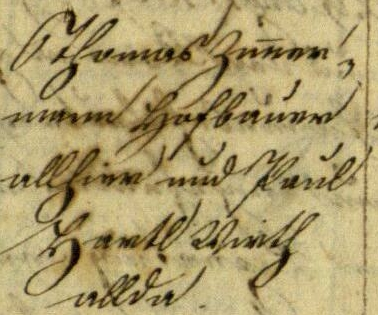

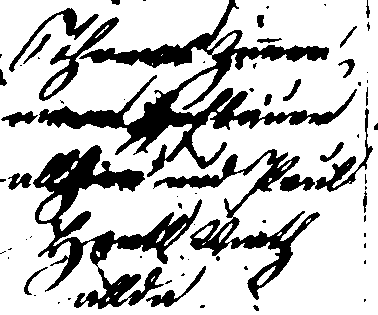

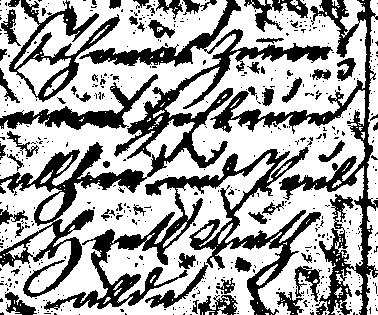

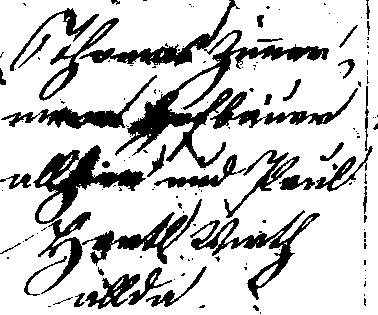

Accuracy otsu: 0.9007306626354246
Accuracy niblack: 0.7965818426135887
Accuracy k-means: 0.9360460233476107
Processing Image 2: 1.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


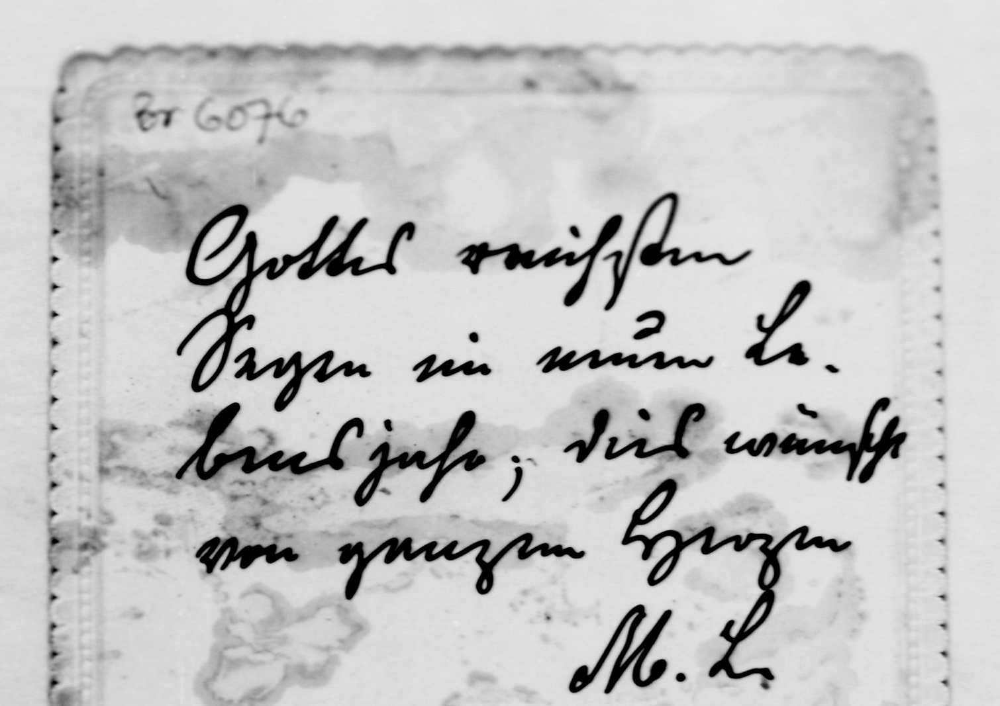

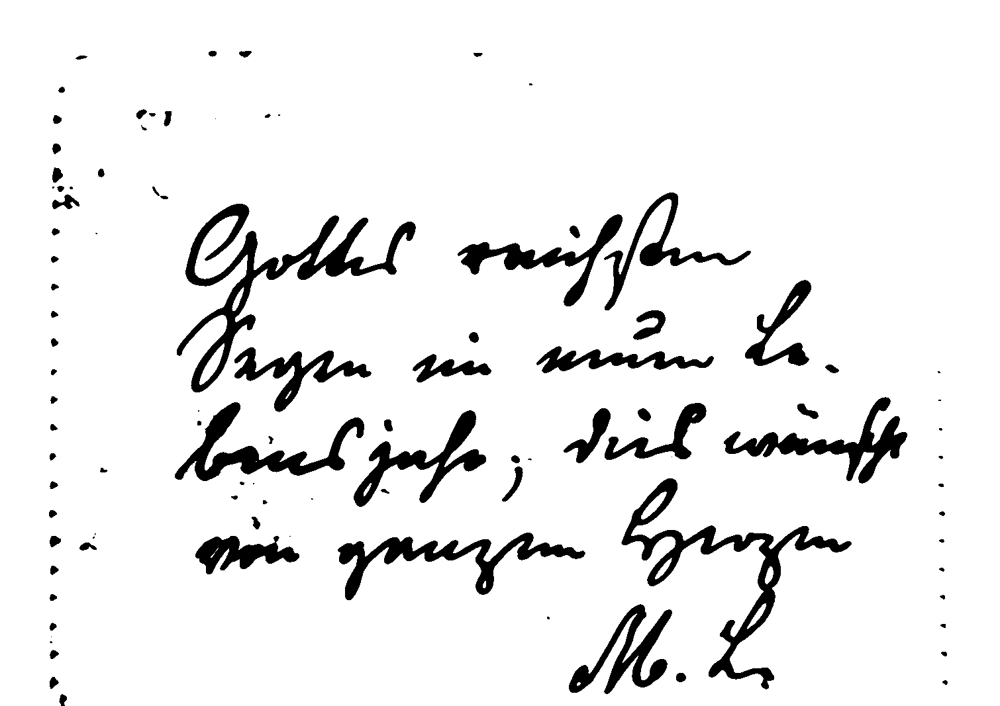

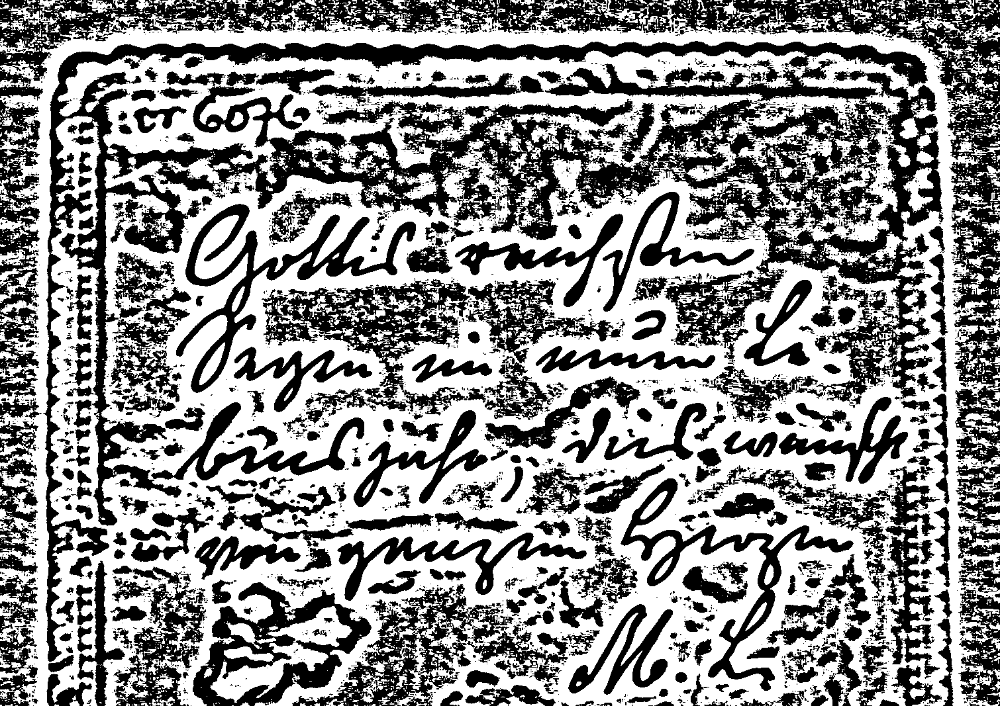

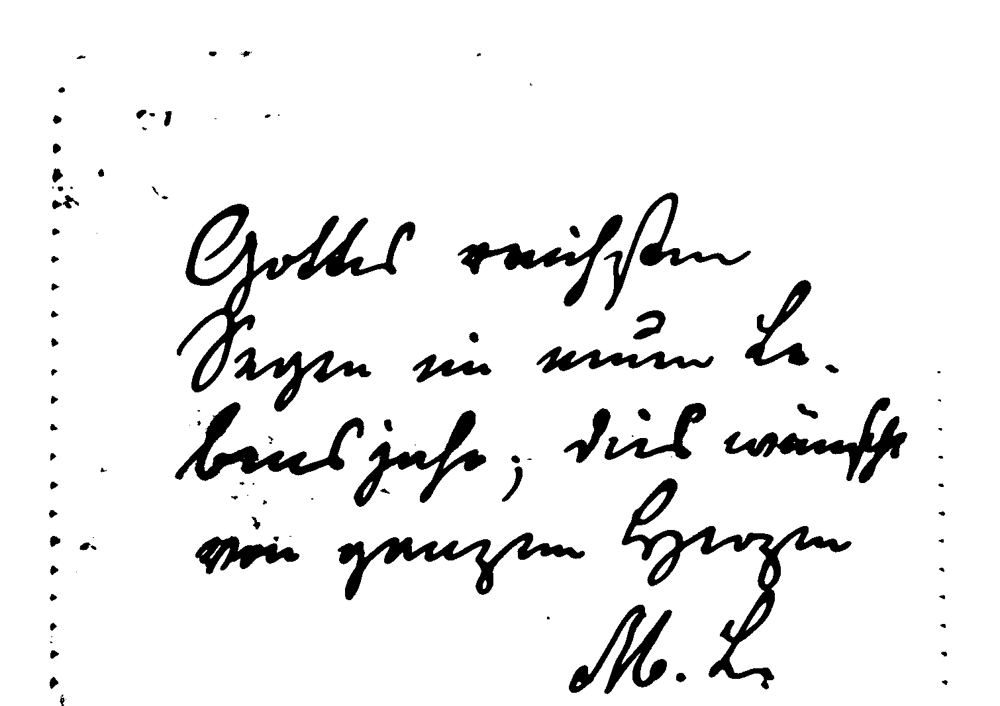

Accuracy otsu: 0.9884642837192847
Accuracy niblack: 0.6218325812918563
Accuracy k-means: 0.9905044160454824
Processing Image 3: 5.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


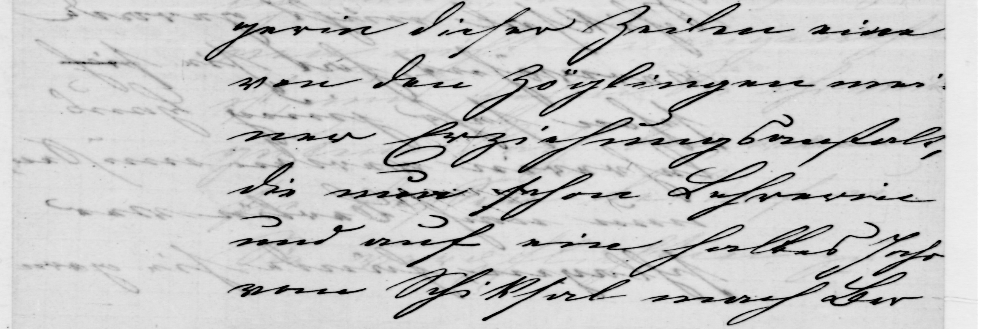

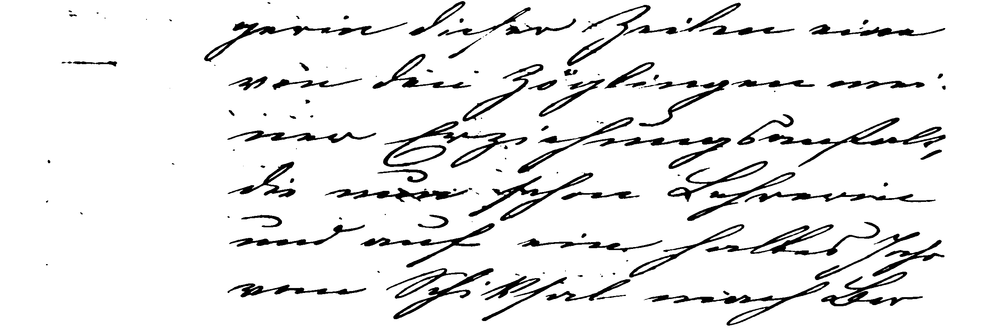

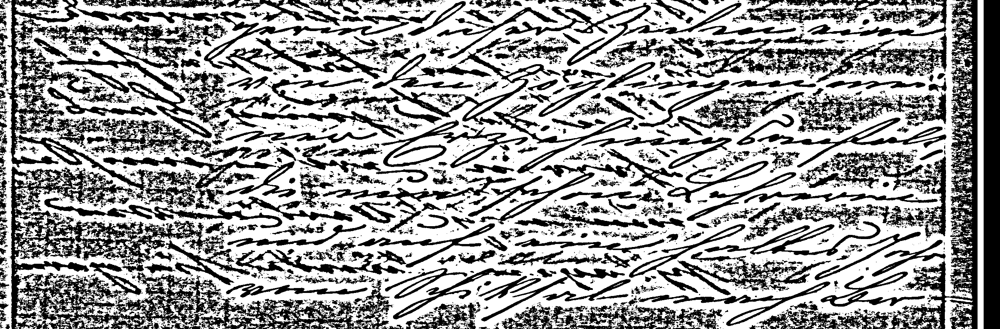

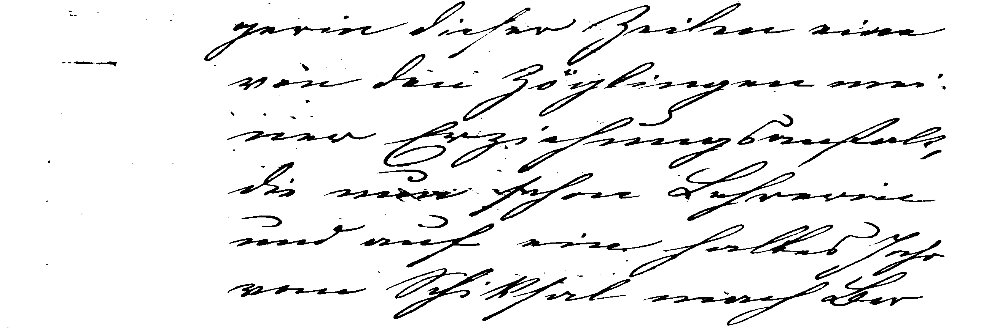

Accuracy otsu: 0.9889189089549331
Accuracy niblack: 0.6875622126368678
Accuracy k-means: 0.9956387515163645
Processing Image 4: 3.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


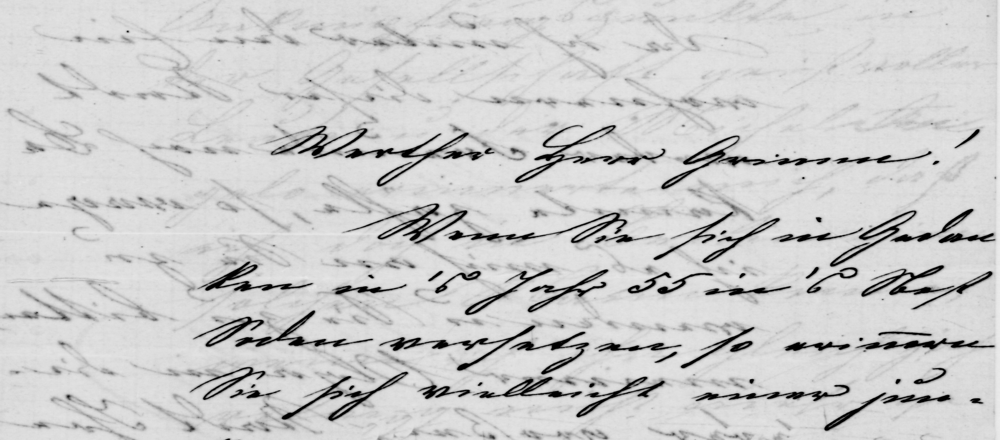

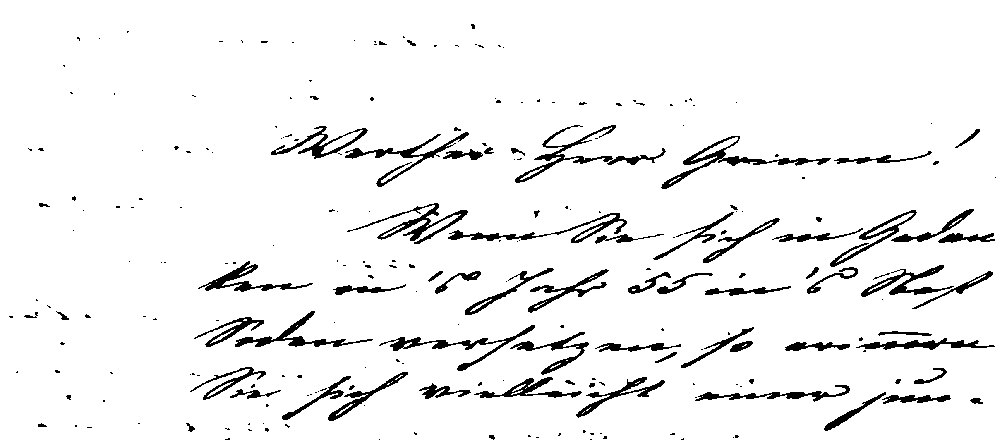

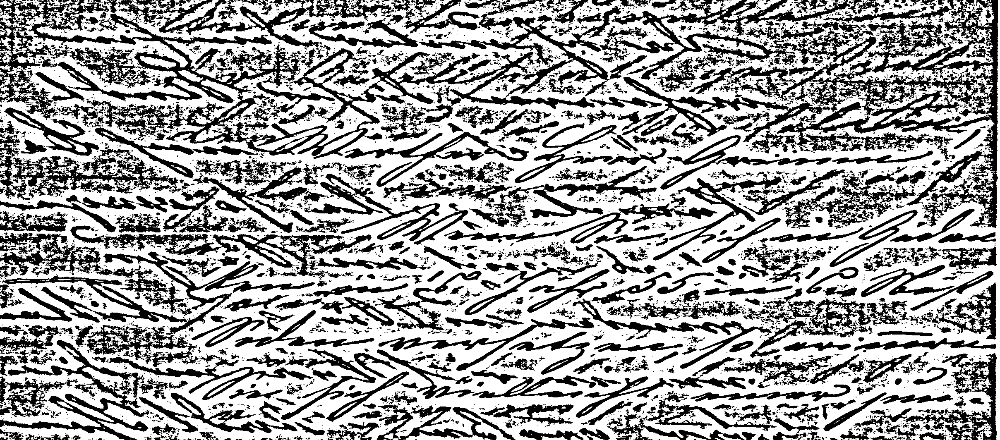

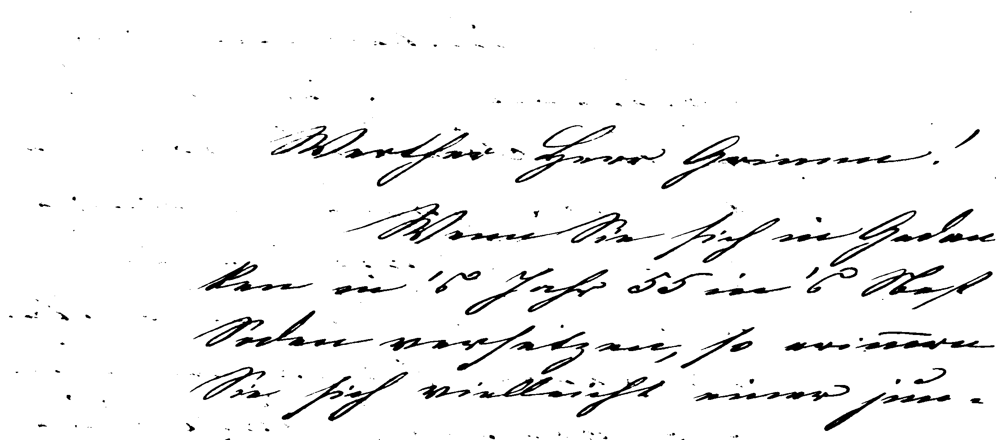

Accuracy otsu: 0.9907271021990226
Accuracy niblack: 0.6744577880364959
Accuracy k-means: 0.9947870814811128
Processing Image 5: 7.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


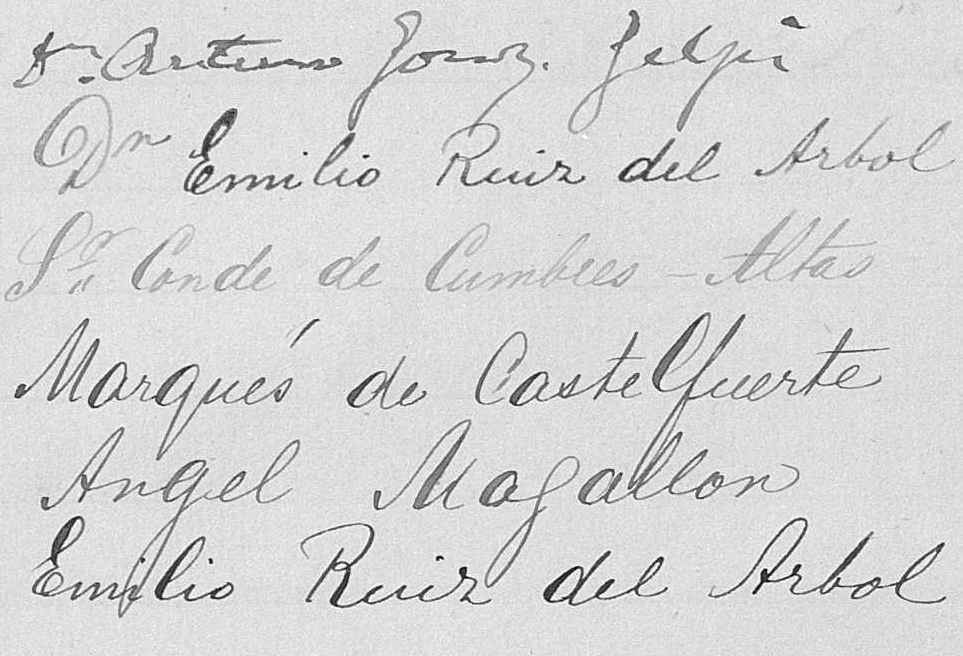

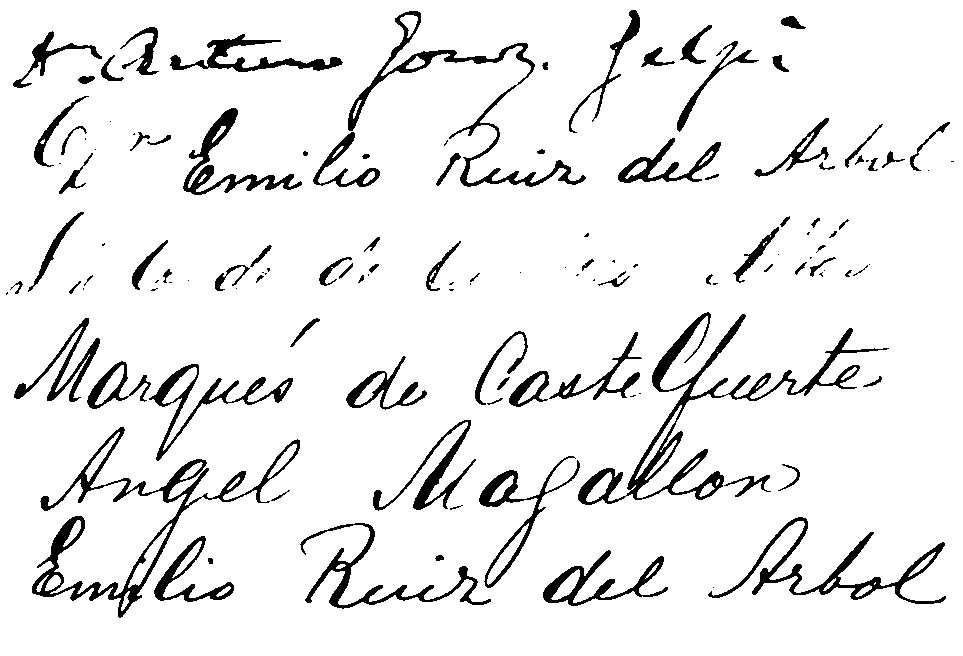

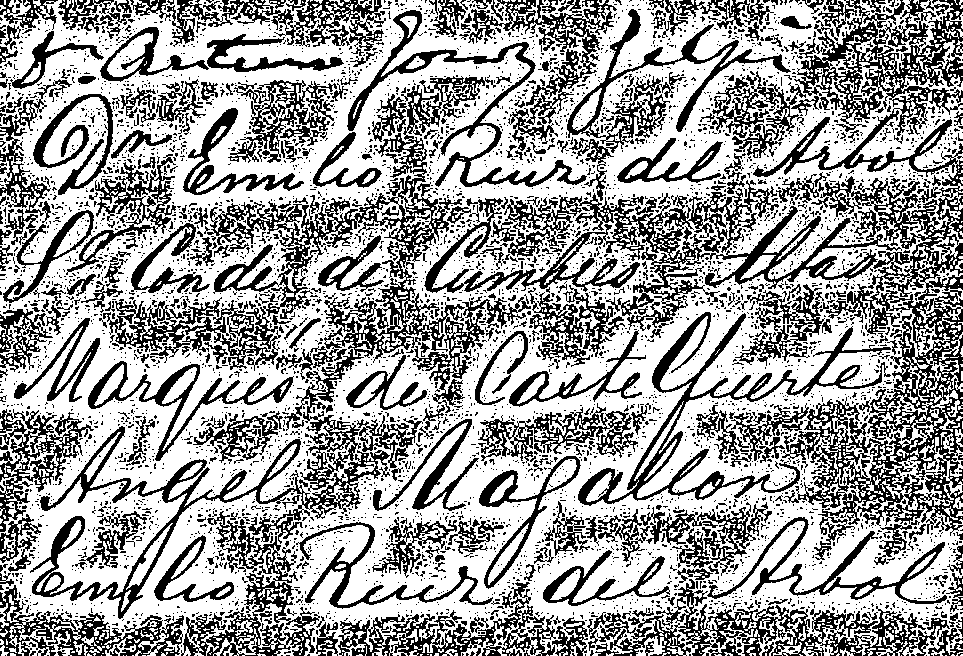

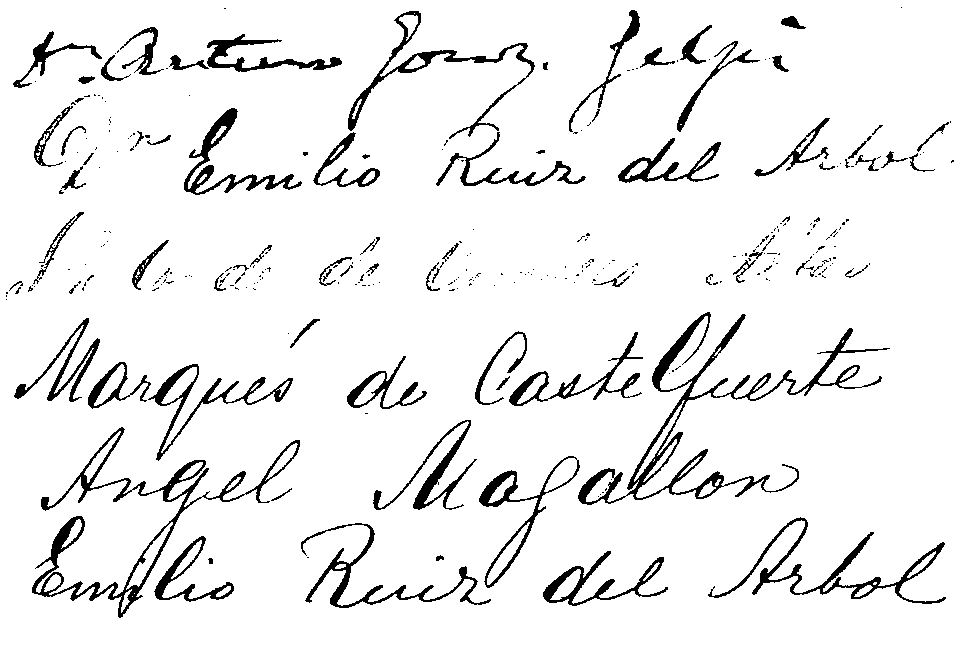

Accuracy otsu: 0.9717789934908695
Accuracy niblack: 0.7169762935947116
Accuracy k-means: 0.9636504951498113
Processing Image 6: 6.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


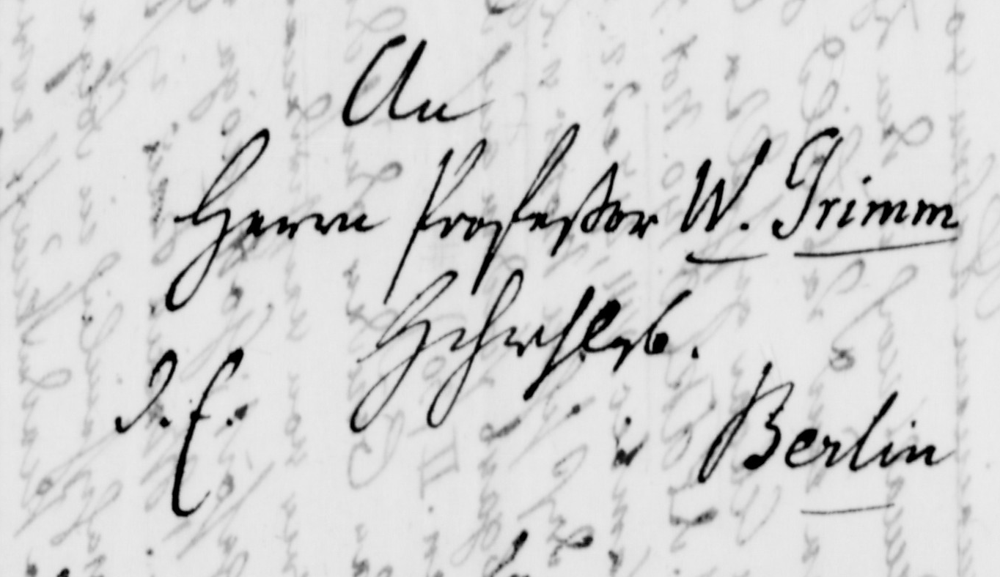

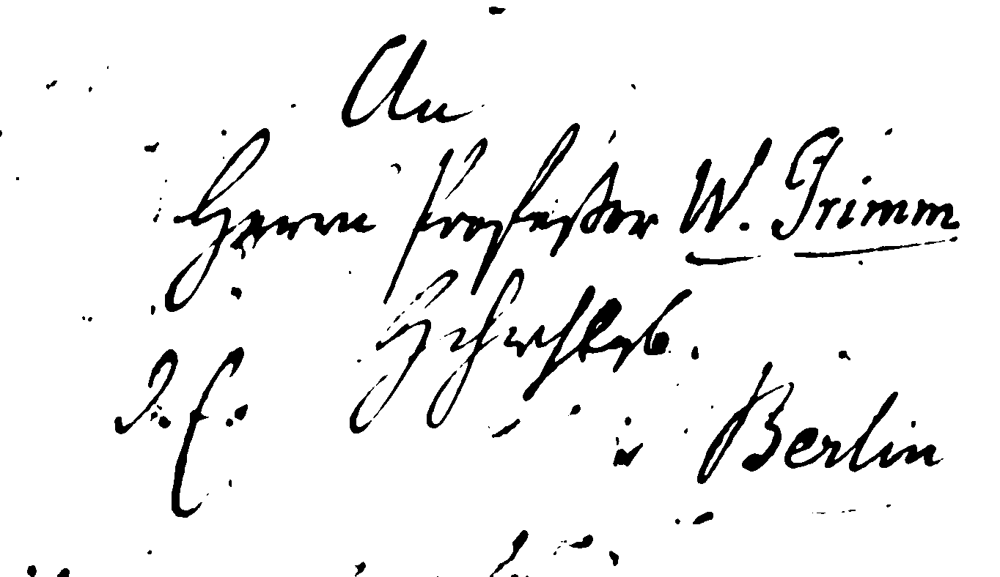

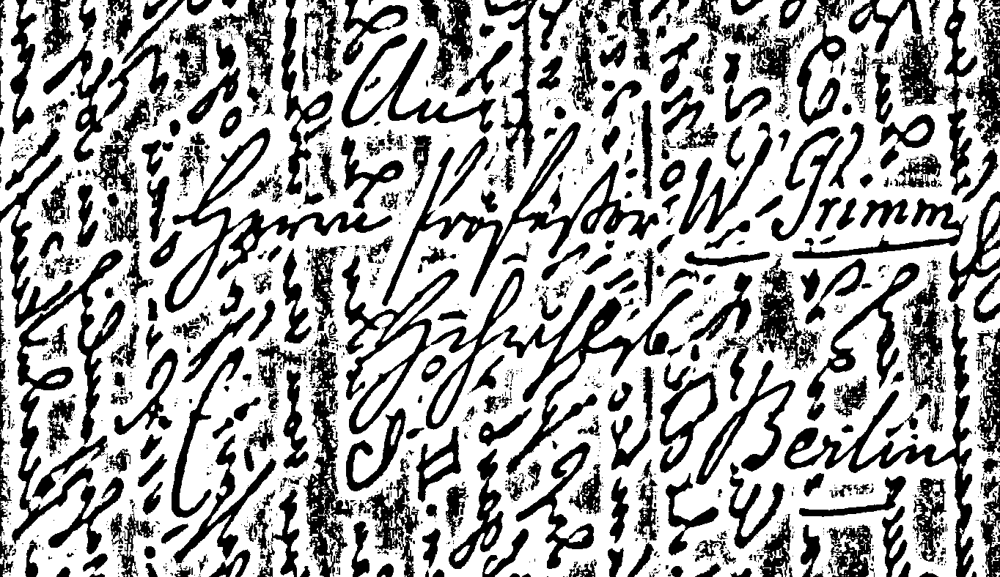

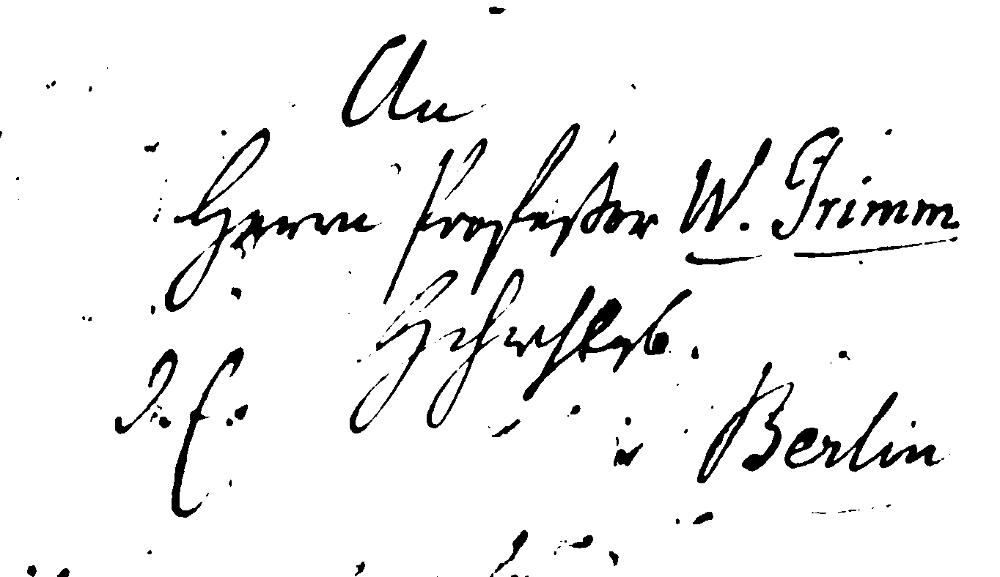

Accuracy otsu: 0.985738236301115
Accuracy niblack: 0.7209275496077526
Accuracy k-means: 0.9857261413876773
Processing Image 7: 2.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


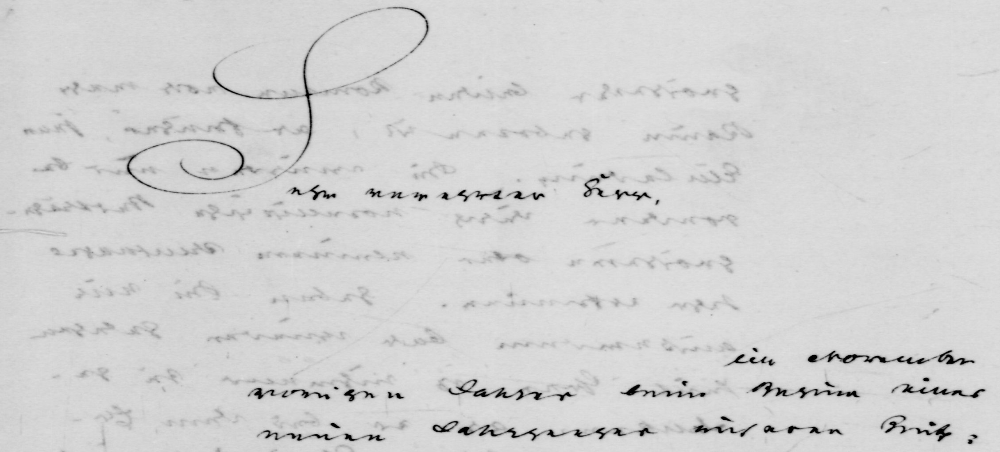

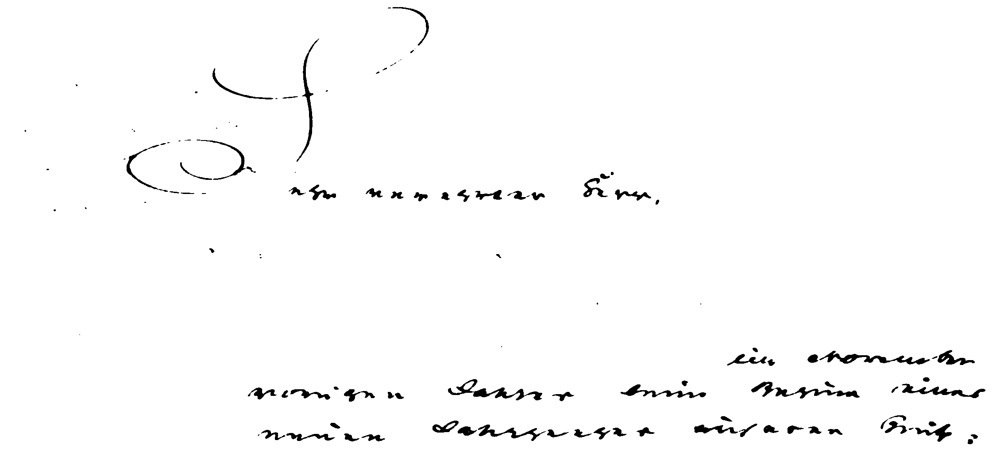

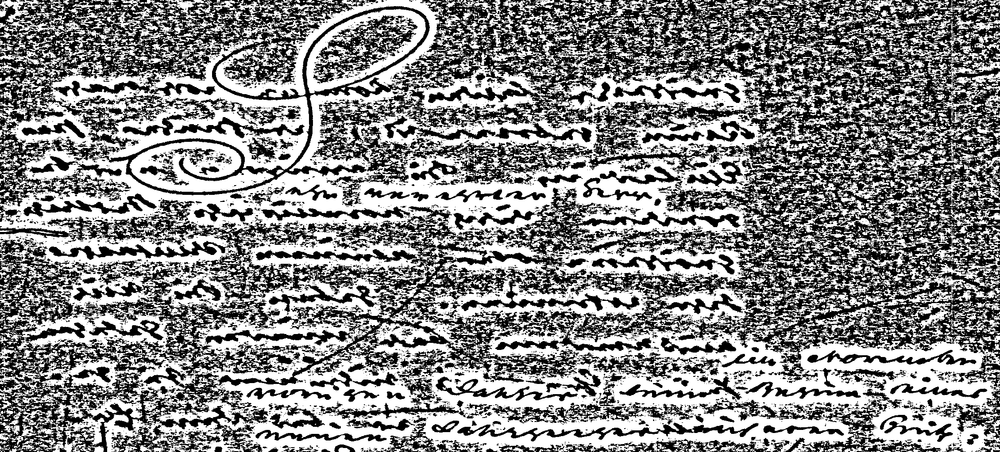

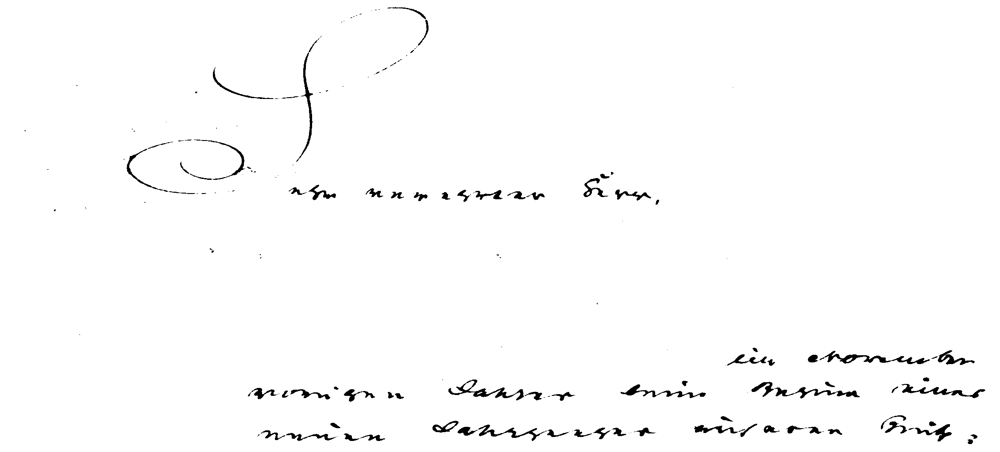

Accuracy otsu: 0.9945338662727173
Accuracy niblack: 0.5556953244911091
Accuracy k-means: 0.9929038056528097
Processing Image 8: 8.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


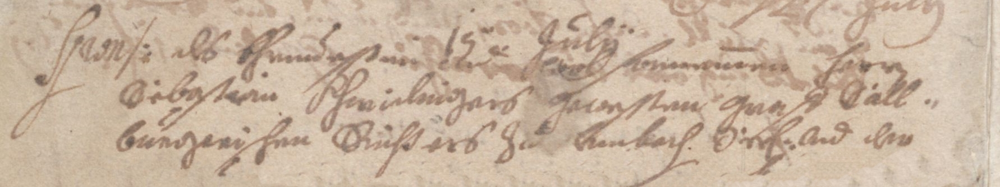

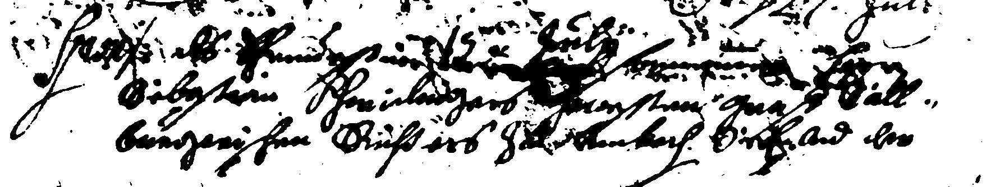

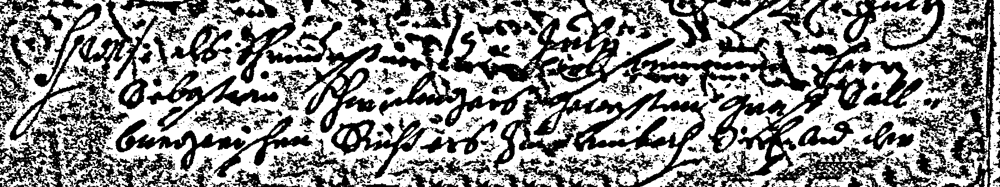

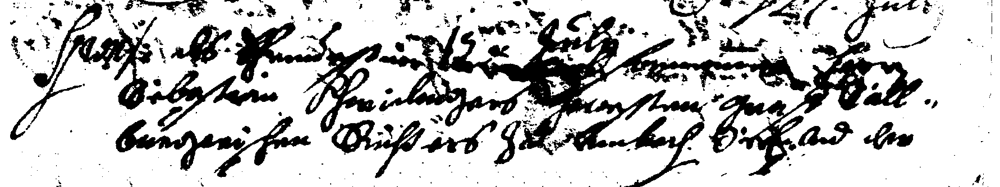

Accuracy otsu: 0.9007506871778329
Accuracy niblack: 0.716113228089276
Accuracy k-means: 0.9079635342110391
Processing Image 9: 4.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


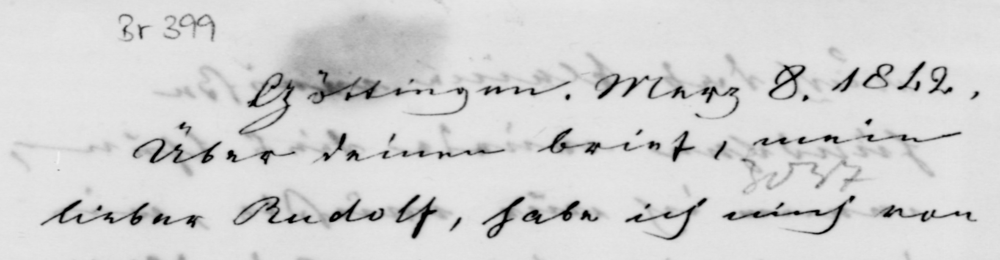

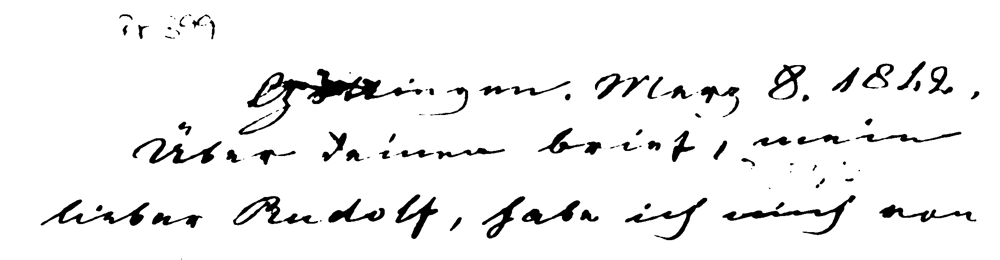

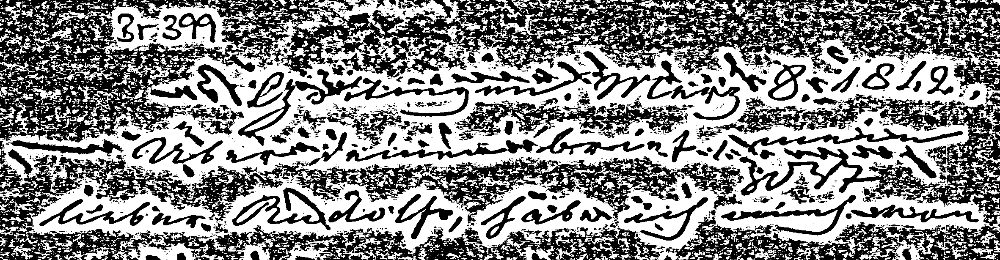

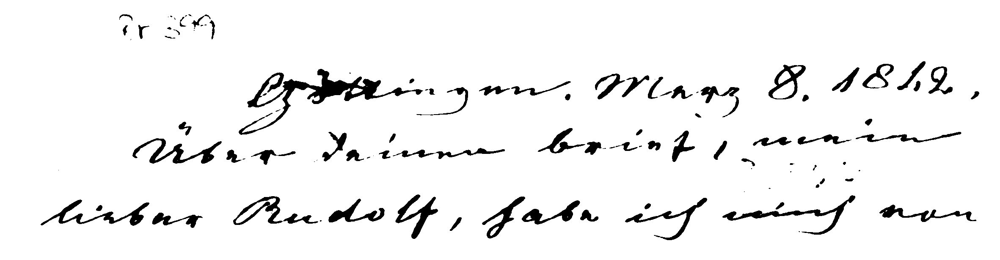

Accuracy otsu: 0.9843612054402389
Accuracy niblack: 0.5928566759218163
Accuracy k-means: 0.9847224659296953
Processing Image 10: 9.bmp


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


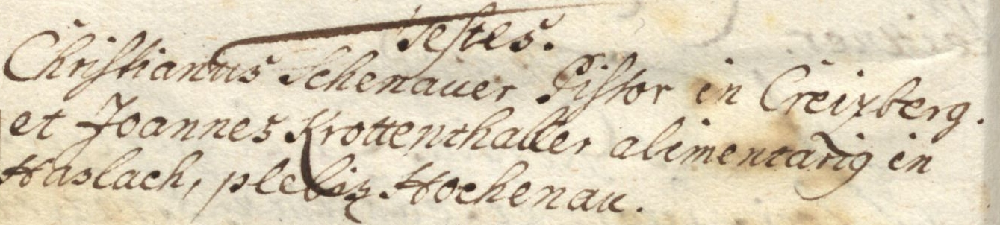

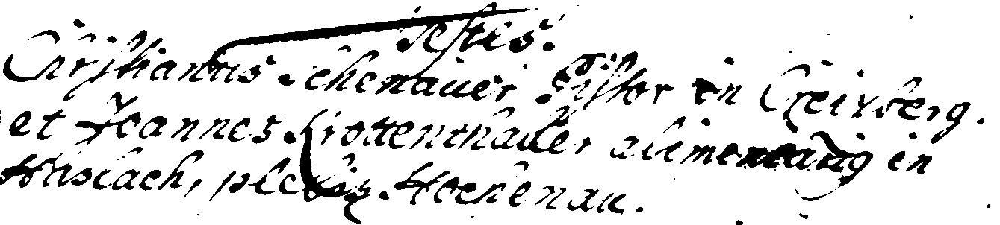

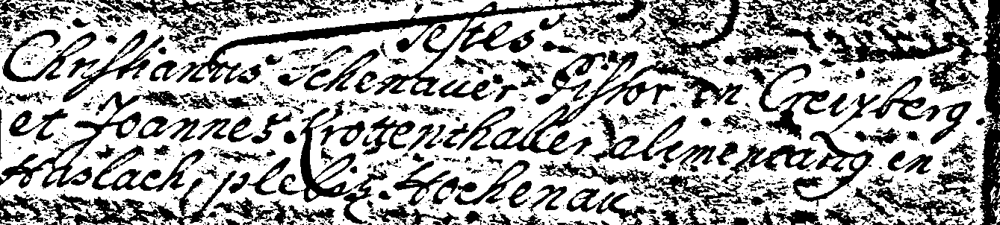

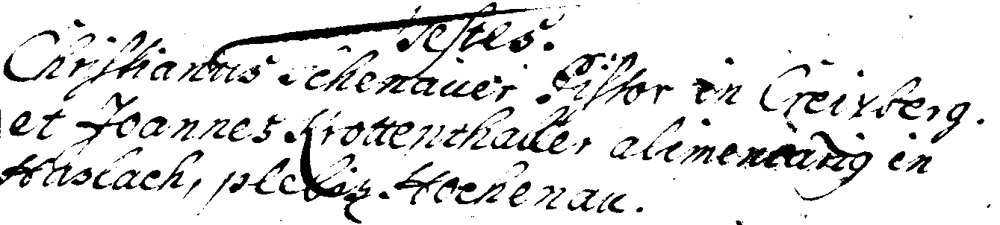

Accuracy otsu: 0.9617783361112623
Accuracy niblack: 0.7728189960878188
Accuracy k-means: 0.9770511748908199


In [3]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from google.colab.patches import cv2_imshow
import os

# Set the folder path where your BMP images are stored
image_folder_path = '/content/drive/My Drive/Colab Notebooks/original_images/'
ground_truth_folder_path = '/content/drive/My Drive/Colab Notebooks/GT/'

# Function to process each image
def process_image(image_path, ground_truth_path):
    # Load the image
    image = cv2.imread(image_path)
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Blur the grayscale image
    blurred = cv2.GaussianBlur(gray_image, (5, 5), 0)
    _, binary_image_otsu = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    binary_image_niblack = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 33, 0.2)
    binary_image_niblack = 255 - binary_image_niblack

    # Apply k-means binarization
    k = 2  # Number of clusters
    binary_image_kmeans = k_means_binarization(gray_image, k)

    # Display the original and binarized images
    cv2_imshow(image)
    cv2_imshow(binary_image_otsu)
    cv2_imshow(binary_image_niblack)
    cv2_imshow(binary_image_kmeans)

    # Load ground truth image
    ground_truth = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
    _, ground_truth_binary = cv2.threshold(ground_truth, 127, 255, cv2.THRESH_BINARY)

    # Flatten the images to 1D arrays
    ground_truth_flat = ground_truth_binary.flatten()
    binary_image_otsu_flat = binary_image_otsu.flatten()
    binary_image_niblack_flat = binary_image_niblack.flatten()
    binary_image_kmeans_flat = binary_image_kmeans.flatten()

    # Calculate accuracy metrics
    accuracy_otsu = accuracy_score(ground_truth_flat, binary_image_otsu_flat)
    accuracy_niblack = accuracy_score(ground_truth_flat, binary_image_niblack_flat)
    accuracy_kmeans = accuracy_score(ground_truth_flat, binary_image_kmeans_flat)

    # Print the results
    print(f"Accuracy otsu: {accuracy_otsu}")
    print(f"Accuracy niblack: {accuracy_niblack}")
    print(f"Accuracy k-means: {accuracy_kmeans}")

# K-means binarization function
def k_means_binarization(image, k):
    # Reshape image into a 2D array of pixels
    pixels = image.reshape((-1, 1))
    # Initialize k-means clustering algorithm
    kmeans = KMeans(n_clusters=k)
    # Fit k-means to pixel values
    kmeans.fit(pixels)
    # Get cluster centers
    centers = np.uint8(kmeans.cluster_centers_)
    # Assign each pixel to the nearest cluster center
    segmented_image = centers[kmeans.labels_]
    # Reshape segmented image to original shape
    segmented_image = segmented_image.reshape(image.shape)
    # Convert segmented image to binary
    _, binary_image = cv2.threshold(segmented_image, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    return binary_image

# Loop through each image file in the folder
for index, filename in enumerate(os.listdir(image_folder_path), start=1):
    if filename.endswith(".bmp"):
        # Get full path of the image and its corresponding ground truth image
        image_path = os.path.join(image_folder_path, filename)
        ground_truth_path = os.path.join(ground_truth_folder_path, filename.split('.')[0] + '_gt.bmp')

        # Print the index of the image being processed
        print(f"Processing Image {index}: {filename}")

        # Process the image
        process_image(image_path, ground_truth_path)
